# Walmart Store Sales Forecasting

For this analysis I'll be using the Walmart data that is availible on Kaggle and can be accessed [here](https://www.kaggle.com/competitions/walmart-recruiting-store-sales-forecasting/data).

The data consists of historical sales data for 45 Walmart stores located in different regions. Each store contains a number of departments, and you are tasked with predicting the department-wide sales for each store.

In addition, Walmart runs several promotional markdown events throughout the year. These markdowns precede prominent holidays, the four largest of which are the Super Bowl, Labor Day, Thanksgiving, and Christmas. The weeks including these holidays are weighted five times higher in the evaluation than non-holiday weeks. Part of the challenge presented by this competition is modeling the effects of markdowns on these holiday weeks in the absence of complete/ideal historical data.

**stores.csv**

This file contains anonymized information about the 45 stores, indicating the type and size of store.

**train.csv**

This is the historical training data, which covers to 2010-02-05 to 2012-11-01. Within this file you will find the following fields:

* Store - the store number
* Dept - the department number
* Date - the week
* Weekly_Sales -  sales for the given department in the given store
* IsHoliday - whether the week is a special holiday week

**test.csv**

This file is identical to train.csv, except we have withheld the weekly sales. You must predict the sales for each triplet of store, department, and date in this file.

**features.csv**

This file contains additional data related to the store, department, and regional activity for the given dates. It contains the following fields:

* Store - the store number
* Date - the week
* Temperature - average temperature in the region
* Fuel_Price - cost of fuel in the region
* MarkDown1-5 - anonymized data related to promotional markdowns that Walmart is running. MarkDown data is only available after Nov 2011, and is not available for all stores all the time. Any missing value is marked with an NA.
* CPI - the consumer price index
* Unemployment - the unemployment rate
* IsHoliday - whether the week is a special holiday week

In [97]:
from statsmodels.tsa.seasonal import seasonal_decompose, STL
import statsmodels.api as sm
from statsmodels.tsa.deterministic import DeterministicProcess
from statsmodels.tsa.holtwinters import Holt
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima


import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import datetime
import numpy as np
import pandas as pd
from scipy import optimize 

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, root_mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor, plot_importance
import xgboost as xgb


In [3]:
# Inspect the files
!head -n10 train.csv

Store,Dept,Date,Weekly_Sales,IsHoliday
1,1,2010-02-05,24924.5,FALSE
1,1,2010-02-12,46039.49,TRUE
1,1,2010-02-19,41595.55,FALSE
1,1,2010-02-26,19403.54,FALSE
1,1,2010-03-05,21827.9,FALSE
1,1,2010-03-12,21043.39,FALSE
1,1,2010-03-19,22136.64,FALSE
1,1,2010-03-26,26229.21,FALSE
1,1,2010-04-02,57258.43,FALSE


In [4]:
!head -n10 test.csv

Store,Dept,Date,IsHoliday
1,1,2012-11-02,FALSE
1,1,2012-11-09,FALSE
1,1,2012-11-16,FALSE
1,1,2012-11-23,TRUE
1,1,2012-11-30,FALSE
1,1,2012-12-07,FALSE
1,1,2012-12-14,FALSE
1,1,2012-12-21,FALSE
1,1,2012-12-28,TRUE


In [5]:
!head -n10 features.csv

Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
1,2010-02-05,42.31,2.572,NA,NA,NA,NA,NA,211.0963582,8.106,FALSE
1,2010-02-12,38.51,2.548,NA,NA,NA,NA,NA,211.2421698,8.106,TRUE
1,2010-02-19,39.93,2.514,NA,NA,NA,NA,NA,211.2891429,8.106,FALSE
1,2010-02-26,46.63,2.561,NA,NA,NA,NA,NA,211.3196429,8.106,FALSE
1,2010-03-05,46.5,2.625,NA,NA,NA,NA,NA,211.3501429,8.106,FALSE
1,2010-03-12,57.79,2.667,NA,NA,NA,NA,NA,211.3806429,8.106,FALSE
1,2010-03-19,54.58,2.72,NA,NA,NA,NA,NA,211.215635,8.106,FALSE
1,2010-03-26,51.45,2.732,NA,NA,NA,NA,NA,211.0180424,8.106,FALSE
1,2010-04-02,62.27,2.719,NA,NA,NA,NA,NA,210.8204499,7.808,FALSE


In [6]:
# Reading in the data
def read_data(location='.'):

    stores_data = pd.read_csv(f'{location}/train.csv',dtype={'IsHoliday': 'boolean'},parse_dates=['Date'])
    stores_data = stores_data.set_index(['Store', 'Dept', 'Date']).sort_index()

    features = pd.read_csv(f'{location}/features.csv',dtype={'IsHoliday': 'boolean'},parse_dates=['Date'])
    features = features.set_index(['Store', 'Date']).sort_index()

    return stores_data, features

In [7]:
stores_data, features = read_data()

In [8]:
features.tail()

Temperature  Fuel_Price  MarkDown1  MarkDown2  MarkDown3  \
Store Date                                                                   
45    2013-06-28        76.05       3.639    4842.29     975.03       3.00   
      2013-07-05        77.50       3.614    9090.48    2268.58     582.74   
      2013-07-12        79.37       3.614    3789.94    1827.31      85.72   
      2013-07-19        82.84       3.737    2961.49    1047.07     204.19   
      2013-07-26        76.06       3.804     212.02     851.73       2.06   

                  MarkDown4  MarkDown5  CPI  Unemployment  IsHoliday  
Store Date                                                            
45    2013-06-28    2449.97    3169.69  NaN           NaN      False  
      2013-07-05    5797.47    1514.93  NaN           NaN      False  
      2013-07-12     744.84    2150.36  NaN           NaN      False  
      2013-07-19     363.00    1059.46  NaN           NaN      False  
      2013-07-26      10.88    1864.57  NaN           NaN      False

In [9]:
stores_data.head()

Weekly_Sales  IsHoliday
Store Dept Date                               
1     1    2010-02-05      24924.50      False
           2010-02-12      46039.49       True
           2010-02-19      41595.55      False
           2010-02-26      19403.54      False
           2010-03-05      21827.90      False

In [10]:
# Check whether the data ranges are the same for each store

min_store_dates = stores_data.reset_index().groupby('Store')['Date'].min()
max_store_dates = stores_data.reset_index().groupby('Store')['Date'].max()

In [11]:
print(f'Number of unique minimum dates: {min_store_dates.nunique()}')
print(f'Number of unique maximum dates: {max_store_dates.nunique()}')

Number of unique minimum dates: 1
Number of unique maximum dates: 1


In [12]:
# Check whether the data ranges are the same for each store and department

numTsPerStoreDep = stores_data.reset_index().groupby(['Store','Dept'])['Date'].count()

In [13]:
numTsPerStoreDep.value_counts(normalize=True)

Date
143    0.798559
1      0.011108
2      0.009006
3      0.005704
4      0.005404
         ...   
77     0.000300
29     0.000300
88     0.000300
103    0.000300
70     0.000300
Name: proportion, Length: 136, dtype: float64

We see that the time series vary in length between departments and stores. Around 80% have the same lenght (143 weeks)

In [14]:
# Check number of stores and departments
n_stores = stores_data.index.get_level_values(0).nunique()
print(f'Number of stores: {n_stores}')

n_departments = stores_data.index.get_level_values(1).nunique()
print(f'Number of departments: {n_departments}')

Number of stores: 45
Number of departments: 81


In [15]:
stores_data.head()

Weekly_Sales  IsHoliday
Store Dept Date                               
1     1    2010-02-05      24924.50      False
           2010-02-12      46039.49       True
           2010-02-19      41595.55      False
           2010-02-26      19403.54      False
           2010-03-05      21827.90      False

In [16]:
# Calculate number of departments per store
stores_data.reset_index().groupby('Store',as_index=False)['Dept'].nunique()

,Store,Dept
0,1,77
1,2,78
2,3,72
3,4,78
4,5,72
5,6,77
6,7,76
7,8,76
8,9,73
9,10,77


In [17]:
(stores_data.reset_index().groupby(['Store','Dept'])['Date'].min() == '2010-02-05').mean()

0.8871209846892825

89% of depeartments have the same start date

We see that not all stores have the same number of departments. Let's plot some of the time series. We'll plot 5 random departments from 5 random stores

In [18]:
np.random.seed(42)
random_stores = np.random.choice(n_stores,5,replace=False)

In [19]:
random_departments = np.random.choice(61,5,replace=False)

In [20]:
sample_data = stores_data.query('Store in @random_stores and Dept in @random_departments')

In [21]:
plot_data = sample_data.drop(columns='IsHoliday').unstack(['Store','Dept']).reset_index(level=0, drop=True)

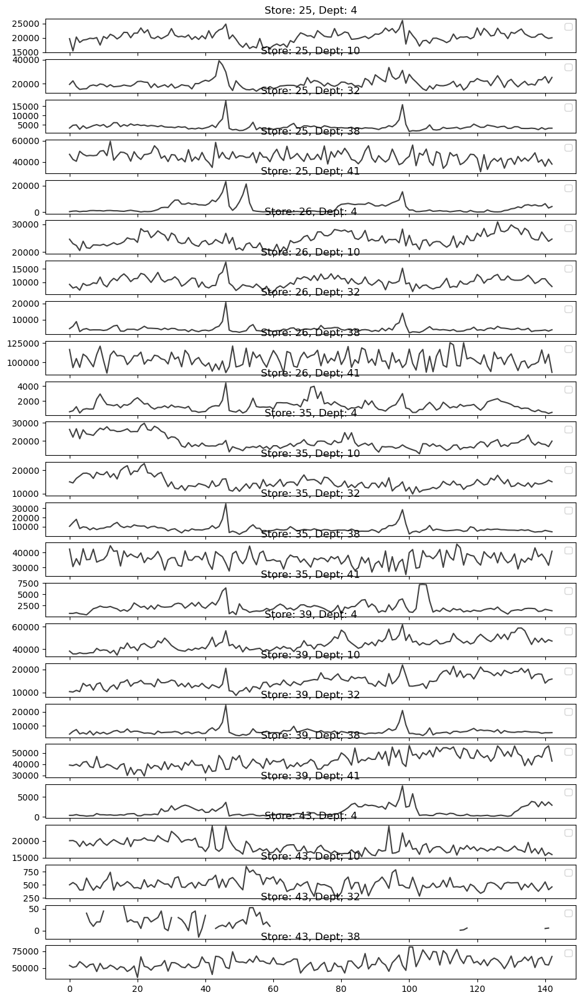

In [26]:
axs = plot_data.plot(
    color='0.25', figsize=(11, 20), subplots=True, sharex=True,title= [f'Store: {row[1]}, Dept: {row[2]}' for row in plot_data.columns.to_list()])
for ax in axs: 
    ax.legend([])

    

From the above plot we see that there are some departments with discontinuity in the data. These values need to be set equal to 0 when using ARIMA or smoothing type of models.

In [27]:
(sample_data['Weekly_Sales'] == 0).sum()

2

In [28]:
(sample_data['Weekly_Sales'].isna()).any()

False

So these weeks with no sales don't even appear in the dataset, and needs to be added and sales should be set equal to 0. Should however ensure that that start date and end dates match between the original and revised dataset

In [29]:
sample_data[sample_data['Weekly_Sales'] == 0]

Weekly_Sales  IsHoliday
Store Dept Date                               
43    32   2010-08-27           0.0      False
           2010-10-08           0.0      False

Let's select one of these time series and model it using the ARIMA modelling process

In [30]:
store39 = sample_data.query('Store == 39 and Dept == 32').reset_index(level=[0,1], drop=True)

In [31]:
max_sales = store39['Weekly_Sales'].max()

In [32]:
store39['HolidaySales'] = np.where(store39['IsHoliday'],max_sales,0)

In [33]:
def plot_acf_pacf(df,title='Weekly Sales',lags=20):
    
    fig = plt.figure(constrained_layout=True,figsize=(12,8))
    gs = GridSpec(2, 2, figure=fig)
    
    ax1 = fig.add_subplot(gs[0, :])
    ax2 = fig.add_subplot(gs[1, 0])
    ax3 = fig.add_subplot(gs[1, 1])
    
    fig = ax1.plot(df.index, df[['Weekly_Sales']])
    ax1.vlines(x=store39.index, ymin=0,ymax= store39[['HolidaySales']],linestyles='dashed',colors='orange')
    
    fig = sm.graphics.tsa.plot_acf(df[['Weekly_Sales']], ax=ax2,bartlett_confint=False,zero=False,lags=lags)
    fig = sm.graphics.tsa.plot_pacf(df[['Weekly_Sales']], ax=ax3,zero=False,method='ywm',lags=lags)
    fig.suptitle(title)
    plt.show()

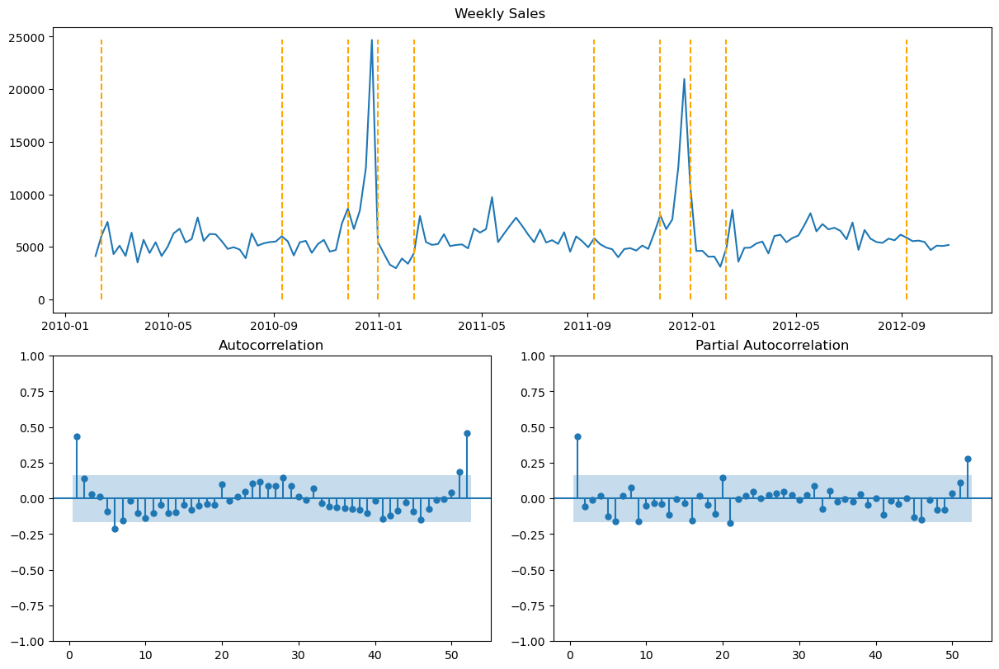

In [34]:
plot_acf_pacf(store39,lags=52)

The weekly sales for this department seems to be stationary and the variance doesn't seem to be canstant over time. There are 2 peaks over the observation period that corresponds to the week before Christmas. The ACF and PACF indicate that this might be possibly and AR(1) process. There also seems to be yearly seasonality

In [35]:
res = STL(store39['Weekly_Sales']).fit()

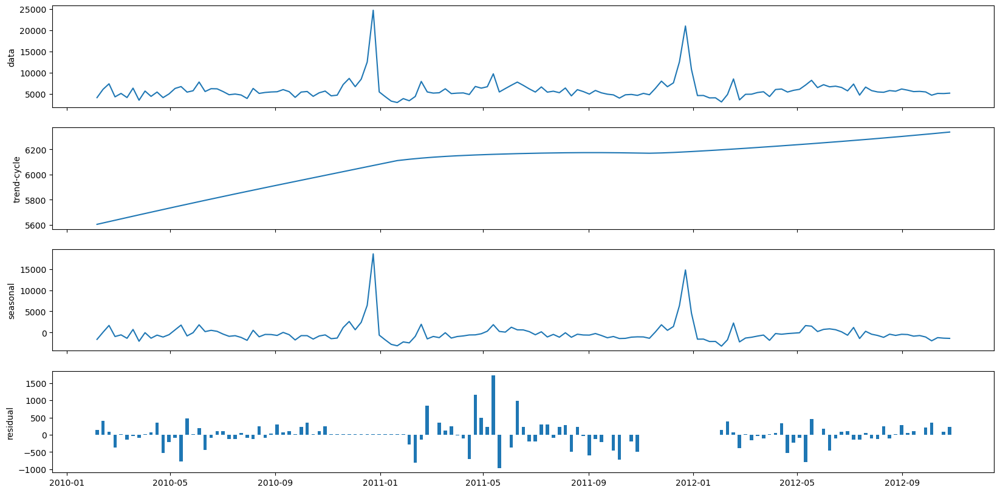

In [36]:
# Plotting the time series and its components together
fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
fig.set_figheight(10)
fig.set_figwidth(20)

# First plot to the Original time series
axes[0].plot(res.observed) 
axes[0].set_ylabel('data')
# second plot to be for trend
axes[1].plot(res.trend)
axes[1].set_ylabel('trend-cycle')
# third plot to be Seasonality component
axes[2].plot(res.seasonal)
axes[2].set_ylabel('seasonal')
# last last plot to be Residual component
axes[3].bar(x =res.resid.index ,height= res.resid,width=4)
axes[3].set_ylabel('residual');

In [37]:
store39.index.freq = 'W-FRI'

In [38]:
y = store39['Weekly_Sales'].copy()

In [39]:
X = store39[['IsHoliday']].copy()

In [40]:
X['IsHoliday'] = np.where(X['IsHoliday'] ,1,0)


In [41]:
store39[store39['Weekly_Sales'] > 20000]

,Weekly_Sales,IsHoliday,HolidaySales
Date,,,
2010-12-24,24684.2,False,0.0
2011-12-23,20974.8,False,0.0


In [42]:
X.loc[['2010-12-24', '2011-12-23'],'WeekBeforeChristmas'] = 1

In [43]:
X.fillna(0,inplace=True)

In [44]:
# I will use last 12 observations as my test set
y_train = y[:-12]
y_test = y[-12:]

In [45]:
X_train = X[:-12]
X_test = X[-12:]

Since the arima model isn't easily identifiable from the ACF and PACF, I'll use a stepwise procedure to identiy the most suitable model that minimises the AIC

In [46]:
model=ARIMA(y_train,X_train,order=(1, 1, 0)).fit()

In [47]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                  131
Model:                 ARIMA(1, 1, 0)   Log Likelihood               -1143.294
Date:                Thu, 19 Jun 2025   AIC                           2294.588
Time:                        11:49:16   BIC                           2306.058
Sample:                    02-05-2010   HQIC                          2299.249
                         - 08-03-2012                                         
Covariance Type:                  opg                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
IsHoliday             460.3460    289.160      1.592      0.111    -106.397    1027.089
WeekBeforeChristmas  1.274e+04    587.465     21.680      0.000    1.16e+04    1.39e+04
ar.L1                  -0.3410      0.066     -5.146      0.000      -0.471      -0.211
sigma2               2.519e+06   2.35e+05     10.703      0.000    2.06e+06    2.98e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.47   Jarque-Bera (JB):                94.59
Prob(Q):                              0.49   Prob(JB):                         0.00
Heteroskedasticity (H):               1.91   Skew:                            -0.27
Prob(H) (two-sided):                  0.04   Kurtosis:                         7.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [48]:
stepwise_fit = auto_arima(y= y_train,X=X_train, start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3,
                          d = 1,trace = True,
                          D=1,
                          seasonal=False,
                          m=0,
                          error_action ='ignore',   # we don't want to know if an order does not work
                          suppress_warnings = True,  # we don't want convergence warnings
                          stepwise = True,
                          with_intercept=False
                     )           # set to stepwise

# To print the summary
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2309.090, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2294.588, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2291.239, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2292.433, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2293.217, Time=0.01 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 0.156 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  131
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1141.620
Date:                Thu, 19 Jun 2025   AIC                           2291.239
Time:                        11:49:16   BIC                           2302.710
Sample:                    02-05-2010   HQIC                          2295.900
                         - 08-03-2012                                         
Covariance Type:                  opg                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
IsHoliday             460.3459    315.331      1.460      0.144    -157.692    1078.384
WeekBeforeChristmas  1.274e+04    644.941     19.748      0.000    1.15e+04     1.4e+04
ma.L1                  -0.4328      0.057     -7.562      0.000      -0.545      -0.321
sigma2               2.429e+06   2.23e+05     10.888      0.000    1.99e+06    2.87e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                61.42
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               2.00   Skew:                            -0.05
Prob(H) (two-sided):                  0.02   Kurtosis:                         6.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

So the time series has been identified as a MA process!

In [49]:
resid = model.resid

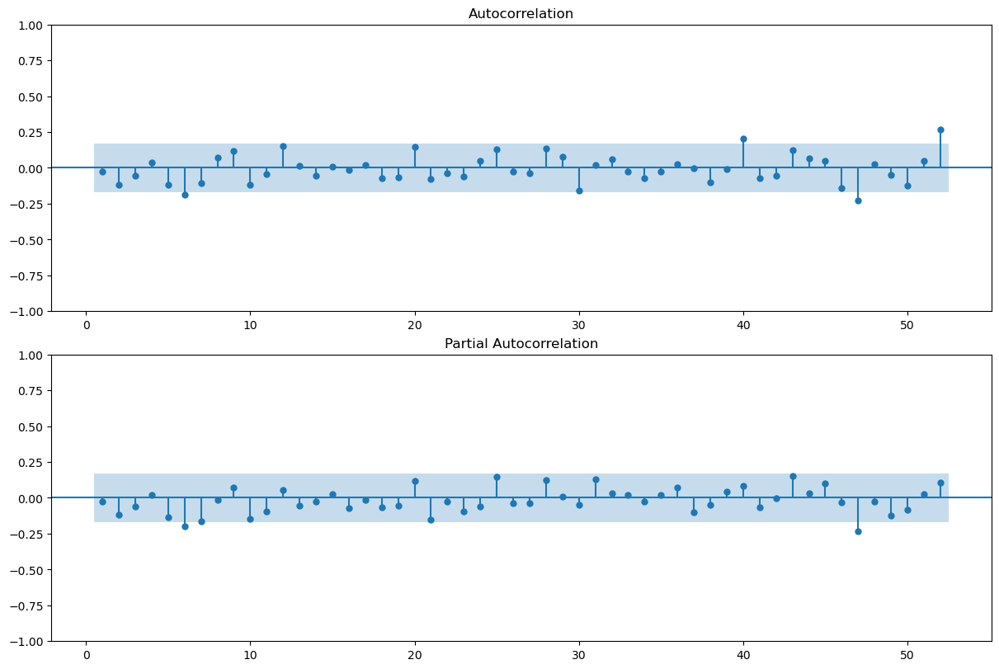

In [50]:
fig = plt.figure(constrained_layout=True,figsize=(12,8))
gs = GridSpec(2, 1, figure=fig)
    
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])

fig = sm.graphics.tsa.plot_acf(resid, ax=ax1,bartlett_confint=False,zero=False,lags=52)
fig = sm.graphics.tsa.plot_pacf(resid, ax=ax2,zero=False,method='ywm',lags=52)

In [51]:
#predict_in_sample = stepwise_fit.predict_in_sample(X_train)[1:]

In [52]:
#oos_predictions_intervals = stepwise_fit.predict(n_periods=12,X=X_test,return_conf_int=True)

In [53]:
#predict_oos = pd.DataFrame(oos_predictions_intervals[0],columns=['Weekly_Sales'])

In [54]:
#predict_oos['lower'] = oos_predictions_intervals[1][:,0]

In [55]:
#predict_oos['upper'] = oos_predictions_intervals[1][:,1]

In [56]:
def predictionsPlot(model,y_train,y_test,X_test):

    predict_in_sample = model.predict()
    oos_predictions_intervals = model.get_forecast(steps=12,exog=X_test)

    predict_oos = pd.DataFrame(oos_predictions_intervals.predicted_mean)
    predict_oos['lower'] = oos_predictions_intervals.conf_int()['lower Weekly_Sales']
    predict_oos['upper'] = oos_predictions_intervals.conf_int()['upper Weekly_Sales']

    axs = y_train.plot(x='Date',y='Weekly_Sales',color='0.25', figsize=(11, 5), subplots=True,label='Actual Sales')
    axs = y_test.plot(x='Date',y='Weekly_Sales',color='0.25', subplots=True, ax=axs, label='')
    axs = predict_in_sample.plot(x='Date',y='prediction',color='C0', subplots=True, ax=axs, label='Predicted Sales')
    axs = predict_oos.plot(y='predicted_mean',color='C0', subplots=True, ax=axs, label='')
    axs = predict_oos.plot(y='lower',color='C0', subplots=True, ax=axs,style='--',label='Lower interval')
    axs = predict_oos.plot(y='upper',color='C0', subplots=True, ax=axs,style='--',label='Upper interval' )

    rmse = root_mean_squared_error(y_test,predict_oos['predicted_mean'])

    return print(f'RMSE on test set: {rmse}')

RMSE on test set: 381.0705172645432


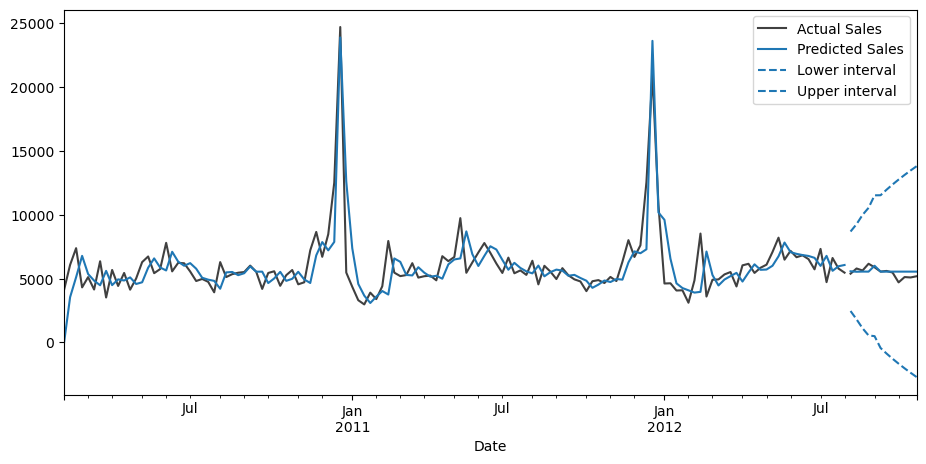

In [57]:
predictionsPlot(model,y_train,y_test,X_test)


Not bad at all for a first version. The problem with using an ARIMA model though is that it needs to be built (or automated in a way) for each store/Department combination.So around 3600 models need to be built. Next I'll use a linear model to fit the trend (since tree models can't extrapolate) and a XGBoost model on the residuals. This is a so-called Hybrid model

# Boosted hybrid model

In [58]:
# Write a class that allows us to fit any two models. One for predicting the trend and a second to predict the residual of the 1st model
class BoostedHybrid:
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None  # store column names from fit method


    def fit(self, X_1, X_2, y):
        self.model_1.fit(X_1, y)
    
        y_fit = pd.DataFrame(
            self.model_1.predict(X_1),
            index=X_1.index, columns=y.columns,
        )
    
        y_resid = y - y_fit
        y_resid = y_resid.melt(ignore_index=False,value_name='residual') # wide to long
        
        self.model_2.fit(X_2,y_resid['residual'])
    
        self.y_columns = y.columns
        self.y_fit = y_fit
        self.y_resid = y_resid



    def predict(self, X_1, X_2):
        y_pred = pd.DataFrame(
            self.model_1.predict(X_1),
            index=X_1.index, columns=self.y_columns,
        )
        y_pred = y_pred.melt(ignore_index=False,value_name='prediction')  # wide to long
    
        y_pred['prediction'] = y_pred['prediction'] + self.model_2.predict(X_2)
        
        return y_pred


Since we have the markup features only from November 2011, I'll model the time series only on this period. 

In [59]:
stores_data, features = read_data()

Next I'll create a function that creates some additional features that will be included in the XGBoost model

In [63]:
def create_features(outcome,features):

    y = outcome.copy()
    X = features.copy()

    y['month'] = y.index.get_level_values(2).month
    y['week'] =np.ceil(y.index.get_level_values(2).day_of_year/7)
    
    y['WeekBeforeChristmas'] = np.where(y.index.get_level_values(2).isin([pd.to_datetime('2010-12-24'), pd.to_datetime('2011-12-23')]),1,0)  

    y['lag_1'] = y.groupby(['Store','Dept'])['Weekly_Sales'].shift(1)

    y['lag_2'] = y.groupby(['Store','Dept'])['Weekly_Sales'].shift(2)

    y['lag_4'] = y.groupby(['Store','Dept'])['Weekly_Sales'].shift(4)

    y['rolling_mean_4'] = y.groupby(['Store','Dept'])['Weekly_Sales'].shift(1).rolling(window=4).mean()

    X['chge_temperature'] = X['Temperature'] - X.groupby('Store')['Temperature'].shift(1)
    X['chge_fuel_price'] = X['Fuel_Price'] - X.groupby('Store')['Fuel_Price'].shift(1)
    X['chge_CPI'] = features['CPI'] - X.groupby('Store')['CPI'].shift(1)
    X['chge_Unemployment'] = X['Unemployment'] - X.groupby('Store')['Unemployment'].shift(1)
    X['IsHoliday'] = np.where(X['IsHoliday'],1,0)

    features_outcome = X.join(y.drop(columns=['IsHoliday']),how='inner')

    features_outcome.reset_index(['Store','Dept'],inplace=True)

    features_outcome = features_outcome.query('Date >= "2011-11-11"')

    return features_outcome

In [64]:
features_outcome = create_features(stores_data,features)

Next I'll create a function that will output the two matrices (datasets) that the Hybrid model requires. The X_1 dataset that will be used in the first model for predicting the trend and the X_2 dataset that will be used in the 2nd model to predict the residual from the first model.

In [65]:
def set_up_X1_X2_matrices(df):
    
    df_temp = df.copy()
    
    y = df_temp.pivot_table(index='Date',columns=['Store','Dept'],values='Weekly_Sales')
    y.fillna(0,inplace=True)

    # X_1: Features for Linear Regression
    dp = DeterministicProcess(index=df_temp.index.unique(), order=1)

    X1 = dp.in_sample()
    
    X2 = df_temp.drop(columns='Weekly_Sales')

    y_temp = y.melt(ignore_index=False).set_index(['Store','Dept'],append=True)
    X2_temp = X2.set_index(['Store','Dept'],append=True)
            
    X2 = y_temp.join(X2_temp, how='left').drop(columns='value').reset_index(level=['Store','Dept'])
            
    impute_vars = X2.columns
    for var in impute_vars:
        X2[var] = X2.groupby(['Date', 'Store'])[var].ffill()


    y_train, y_valid = y.iloc[:-12], y.iloc[-12:]
    X1_train, X1_valid = X1.iloc[:-12], X1.iloc[-12:]
    X2_train = X2.query("Date < '2012-08-10'")
    X2_valid = X2.query("Date >='2012-08-10'")
    
    return y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid



   

In [66]:
y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid = set_up_X1_X2_matrices(features_outcome)

In [546]:
model = BoostedHybrid(LinearRegression(),XGBRegressor())
model.fit(X1_train, X2_train, y_train)
y_fit = model.predict(X1_train, X2_train).clip(0.0) # To ensure values are not negative
y_pred = model.predict(X1_valid, X2_valid).clip(0.0)

In [548]:
# Calculate MSE on validation set
actual = stores_data.query('Date > "2012-08-03"').drop(columns='IsHoliday')

In [549]:
actual_predicted = actual.join(y_pred.set_index(['Store','Dept'],append=True),how='inner')

In [550]:
actual_predicted['squared_error'] = (actual_predicted['Weekly_Sales'] - actual_predicted['prediction'])**2

In [564]:
# RMSE 
np.sqrt(actual_predicted['squared_error'].mean())

7801.62861361519

In [565]:
# RMSE per store
np.sqrt(actual_predicted.groupby('Store')['squared_error'].mean())

Store
1      7141.912484
2      9413.044824
3      2702.074567
4     10957.526334
5      2169.227430
6      8192.827853
7      6641.640334
8      6119.370498
9      4290.568726
10    12836.832047
11     7128.194558
12     5824.752402
13    11733.337360
14    12701.302319
15     6287.416154
16     5851.044848
17     7853.369527
18     8235.733490
19    11546.683672
20    13660.474056
21     4947.075465
22     9199.872763
23    12256.409761
24     8527.403594
25     6095.577676
26     6135.268298
27    10957.999380
28     6277.131547
29     4555.494251
30     1692.004442
31     5698.134007
32     6813.265663
33     1583.260690
34     5241.593603
35    10103.819109
36     1767.280225
37     1939.878649
38     2137.686132
39     9019.153418
40     6122.138666
41     8746.812979
42     2687.559414
43     2825.012747
44     1805.255976
45     6169.929792
Name: squared_error, dtype: float64

Lastly I'll plot the actual and predicted sales for a Store

In [60]:
def draw_plots(y_fit,y_pred,y,store):

    store_predictions = y_fit.query('Store == @store').reset_index().drop(columns=['Store'])

    store_sales_train = y.query('Store == @store and Date <= "2012-08-03"').reset_index().drop(columns=['IsHoliday','Store'])

    store_predictions_oos = y_pred.query('Store == @store').reset_index().drop(columns=['Store'])

    store_sales_valid = y.query('Store == @store and Date > "2012-08-03"').reset_index().drop(columns=['IsHoliday','Store'])

    departments = store_sales_train['Dept'].unique()

    for department in departments:

        train = store_sales_train.query('Dept == @department')
        valid = store_sales_valid.query('Dept == @department')
        pred = store_predictions.query('Dept == @department')
        oos_pred = store_predictions_oos.query('Dept == @department')

    
        axs = train.plot(x='Date',y='Weekly_Sales',color='0.25', figsize=(11, 5), subplots=True,label='Actual Sales')
        axs = valid.plot(x='Date',y='Weekly_Sales',color='0.25', subplots=True, ax=axs,label='')
        axs = pred.plot(x='Date',y='prediction',color='C0', subplots=True, ax=axs,label='Prediction')
        axs = oos_pred.plot(x='Date',y='prediction',color='C0', subplots=True, ax=axs,style='--',label= 'oos Prediction')
    
    plt.close()

/opt/miniconda3/lib/python3.12/site-packages/pandas/plotting/_matplotlib/tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


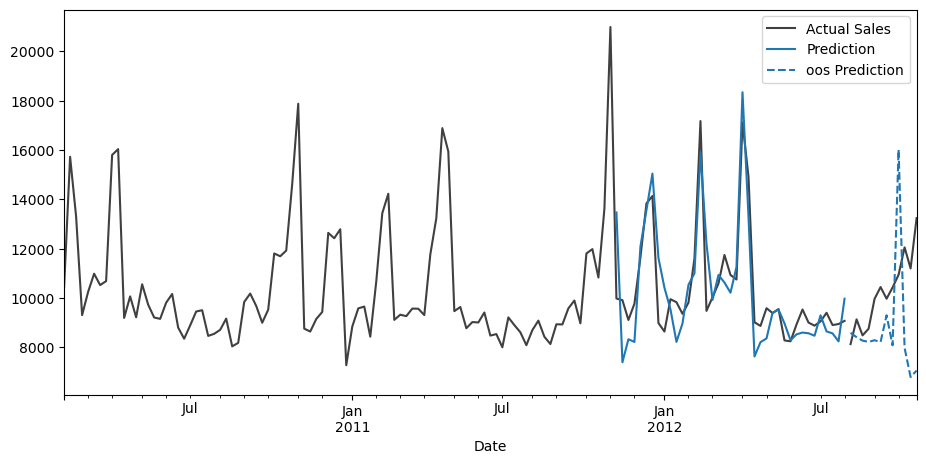

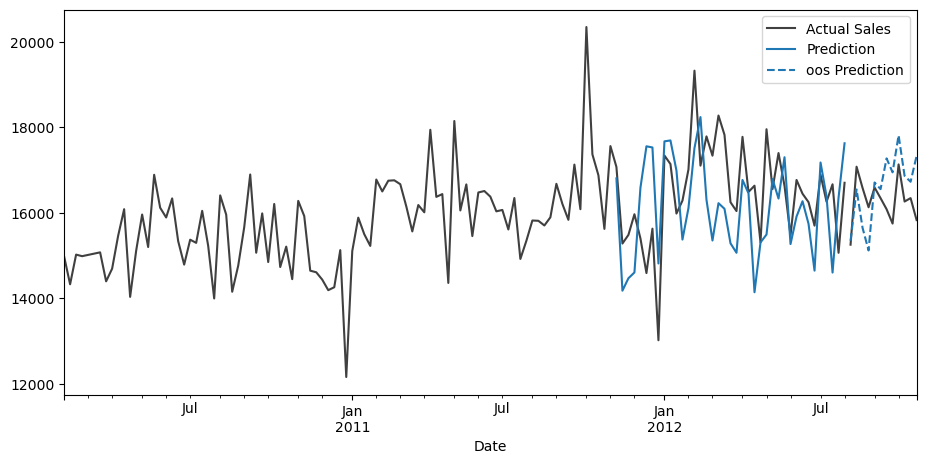

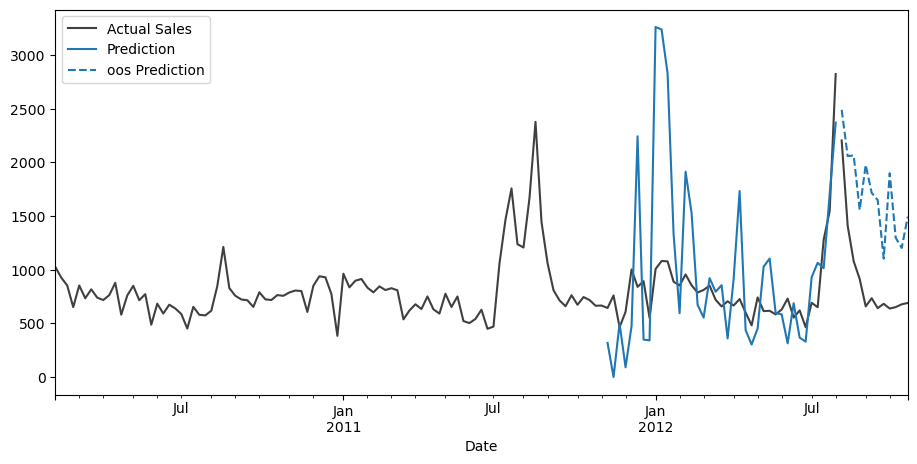

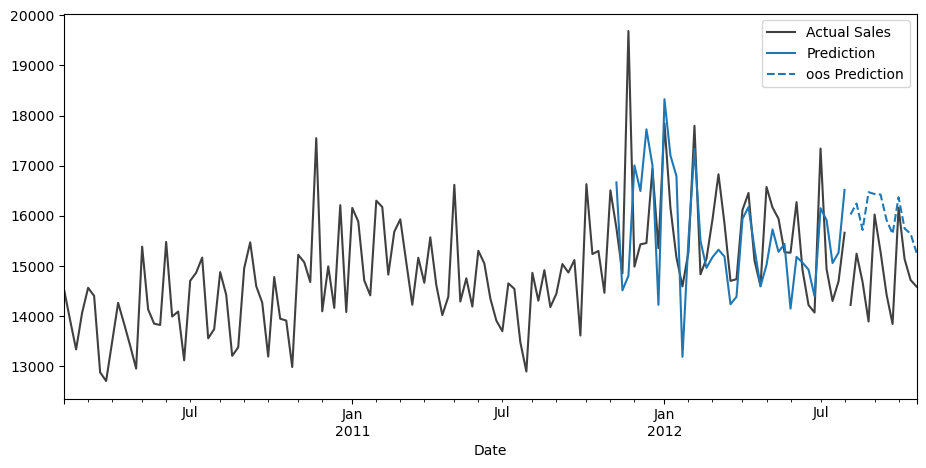

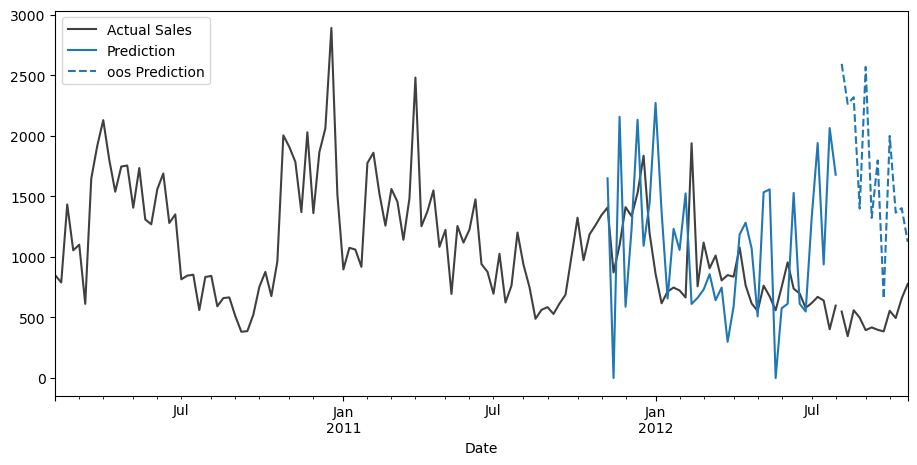

...

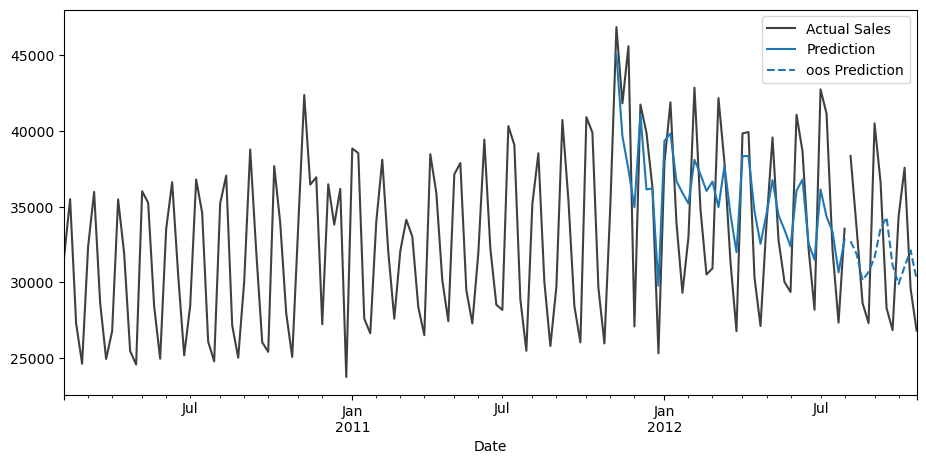

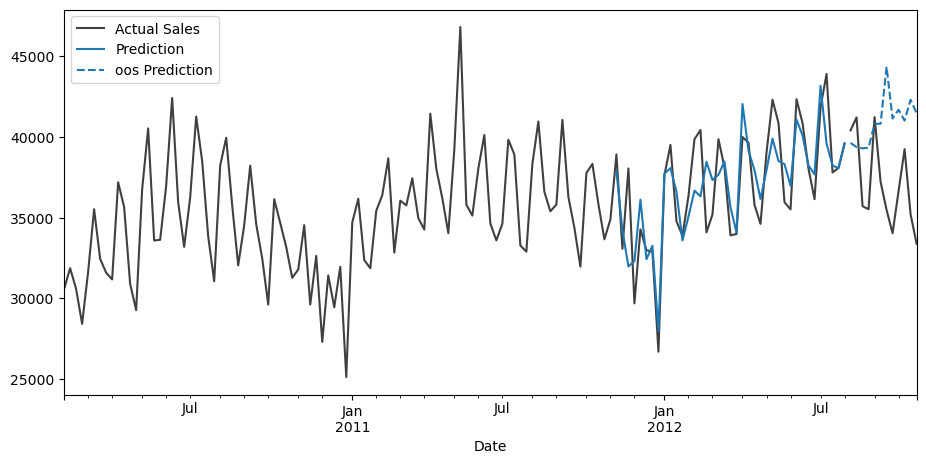

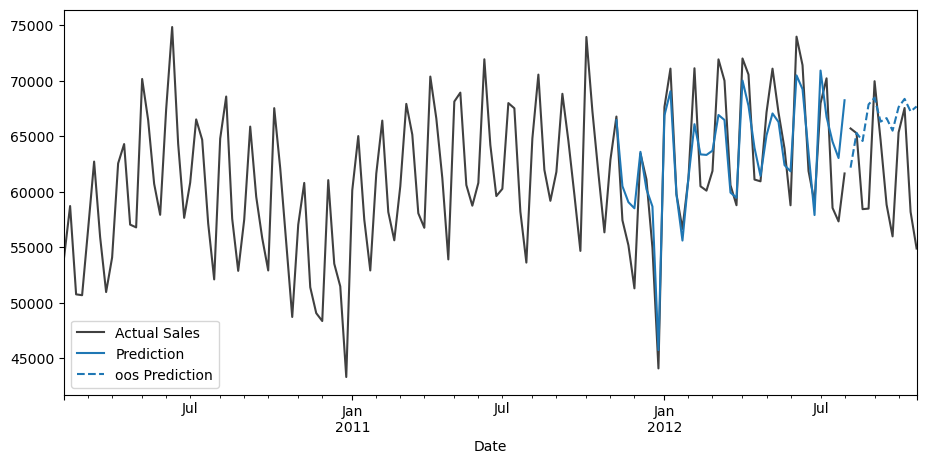

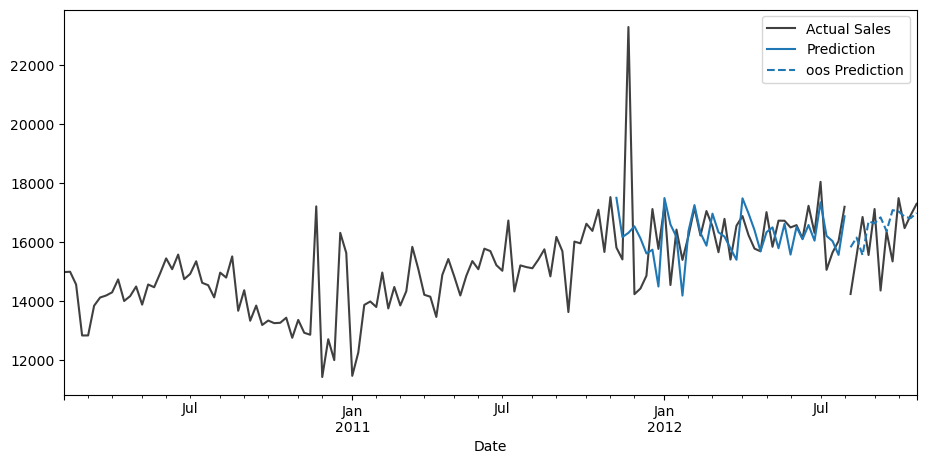

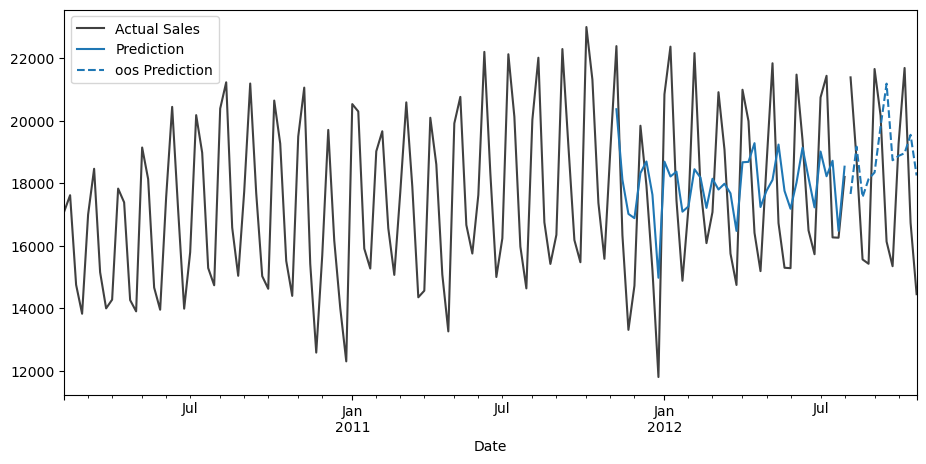

In [554]:
draw_plots(y_fit,y_pred,stores_data,42)

From the above plot we see that for some departments, the forecasts are quite accurate. These are mostly for departments with high weekly sales. The model doesn't perform as well for Departments with low sales and tend to over-estimate the sales and exaggerate the peaks. 

Next I'll fit a XGBoost model without modelling the trend seperately

In [88]:
train = features_outcome.query("Date < '2012-08-10'").copy()
valid = features_outcome.query("Date >= '2012-08-10'").copy()

In [89]:
features = [x for x in train.columns if x != 'Weekly_Sales']
target = 'Weekly_Sales'

dtrain = xgb.DMatrix(train[features], label=train[target])
dvalid = xgb.DMatrix(valid[features], label=valid[target])

params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'eta': 0.1,
    'max_depth': 6
}

model = xgb.train(params, dtrain, num_boost_round=1000, 
                  evals=[(dtrain, 'train'), (dvalid, 'valid')],
                  early_stopping_rounds=50)

[0]	train-rmse:21449.89099	valid-rmse:19766.74268
[1]	train-rmse:19507.29790	valid-rmse:17830.20041
[2]	train-rmse:17771.86386	valid-rmse:16094.68528
[3]	train-rmse:16215.65975	valid-rmse:14546.82768
[4]	train-rmse:14830.29831	valid-rmse:13165.83764
[5]	train-rmse:13598.36228	valid-rmse:11929.13542
[6]	train-rmse:12508.53531	valid-rmse:10817.09422
[7]	train-rmse:11538.77008	valid-rmse:9825.85276
[8]	train-rmse:10649.51521	valid-rmse:8944.46623
[9]	train-rmse:9880.99201	valid-rmse:8157.46256
[10]	train-rmse:9205.80219	valid-rmse:7465.63596
[11]	train-rmse:8607.32551	valid-rmse:6843.72962
[12]	train-rmse:8070.78273	valid-rmse:6308.57266
[13]	train-rmse:7602.51863	valid-rmse:5834.79283
[14]	train-rmse:7202.25541	valid-rmse:5423.36867
[15]	train-rmse:6866.53043	valid-rmse:5053.01327
[16]	train-rmse:6529.18786	valid-rmse:4736.84721
[17]	train-rmse:6220.50177	valid-rmse:4470.39016
[18]	train-rmse:6000.05053	valid-rmse:4236.64519
[19]	train-rmse:5771.42660	valid-rmse:4042.71280
[20]	train-rms

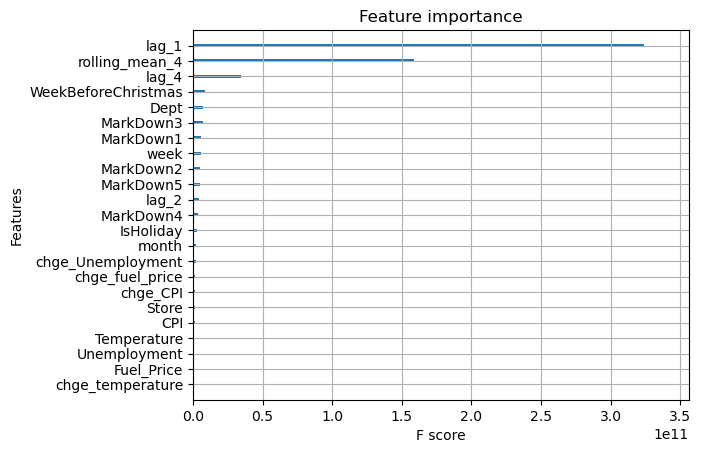

In [103]:
plot_importance(model,importance_type='gain',show_values=False)
plt.show()

This is quite an important finding, because it shows that even if you only include the top 10 features, the model perofrmance shouldn't deteriorate too much. This is also important for forcasting, because many times these features will not be readily availible as of time of forecasting. The top ten features in this model would be though, since it is set by the Company (markdown) or can be derived (Week before Christmas or Week) and is not external data that needs to be sourced (CPI data). 

Let's do some parameter tuning to see if we can improve on the previous model

In [72]:
# Define the hyperparameter search space
model = XGBRegressor(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

# Create a TimeSeriesSplit object for time series cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Perform grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit the grid search object on the training data
grid_search.fit(train.drop(columns='Weekly_Sales'),train['Weekly_Sales'])

# Retrieve the best model and best hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

In [73]:
grid_search.best_params_

{'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}

In [74]:
params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'eta': 0.2,
    'max_depth': 5
}

model = xgb.train(params, dtrain, num_boost_round=200, 
                  evals=[(dtrain, 'train'), (dvalid, 'valid')],
                  early_stopping_rounds=50)

[0]	train-rmse:19346.98314	valid-rmse:17622.96158
[1]	train-rmse:16002.52078	valid-rmse:14215.10108
[2]	train-rmse:13388.22419	valid-rmse:11516.81505
[3]	train-rmse:11370.59883	valid-rmse:9421.92779
[4]	train-rmse:9833.08764	valid-rmse:7750.78718
[5]	train-rmse:8674.37931	valid-rmse:6477.94581
[6]	train-rmse:7775.96686	valid-rmse:5537.75446
[7]	train-rmse:7138.38413	valid-rmse:4824.74239
[8]	train-rmse:6671.63165	valid-rmse:4308.34035
[9]	train-rmse:6315.75603	valid-rmse:3925.56363
[10]	train-rmse:6072.63764	valid-rmse:3651.24833
[11]	train-rmse:5869.20937	valid-rmse:3482.90796
[12]	train-rmse:5667.27101	valid-rmse:3359.13076
[13]	train-rmse:5387.65843	valid-rmse:3285.09902
[14]	train-rmse:5283.61041	valid-rmse:3230.80902
[15]	train-rmse:5208.68307	valid-rmse:3192.57328
[16]	train-rmse:4989.13107	valid-rmse:3171.32143
[17]	train-rmse:4946.96759	valid-rmse:3159.97325
[18]	train-rmse:4896.01733	valid-rmse:3154.88842
[19]	train-rmse:4848.02290	valid-rmse:3149.62400
[20]	train-rmse:4635.35

This is a nice imporvemnt on the performace of the Hybrid model and indicates that most of the time series seems to be stationary

In [75]:
xgboost_pred = model.predict(dvalid).clip(0)

In [76]:
actual_predicted = valid[['Store','Weekly_Sales']].copy()

In [77]:
actual_predicted['prediction'] = xgboost_pred

In [78]:
actual_predicted['squared_error'] = (actual_predicted['Weekly_Sales'] - actual_predicted['prediction'])**2

In [79]:
# RMSE 
np.sqrt(actual_predicted['squared_error'].mean())

3173.2688996032557

In [80]:
# MSE per store
np.sqrt(actual_predicted.groupby('Store')['squared_error'].mean())

Store
1     3392.778173
2     4110.923652
3     1593.406029
4     4605.413239
5     1226.774083
6     3392.821018
7     1981.593250
8     2366.575591
9     1989.660438
10    4366.092080
11    3229.234641
12    3467.652440
13    4926.906754
14    4781.072920
15    1754.181412
16    3800.477729
17    4592.177279
18    3285.100316
19    3685.941762
20    4569.057175
21    2507.066267
22    2720.858944
23    3961.582167
24    2832.878273
25    2007.915618
26    2378.746783
27    4418.217288
28    4714.582171
29    1907.946102
30    1235.435220
31    3123.812221
32    2783.525869
33    1357.724877
34    2123.440349
35    2414.701317
36    1135.015053
37    1334.412744
38    1878.762533
39    4151.828878
40    2210.169281
41    3533.870508
42    2076.168193
43    2043.491033
44    1594.722674
45    1814.391383
Name: squared_error, dtype: float64

In [81]:
y_fit_xgb = train[['Store','Dept']].copy()

In [82]:
y_fit_xgb['prediction'] = model.predict(dtrain).clip(0)

In [83]:
y_pred_xgb = valid[['Store','Dept']].copy()

In [84]:
y_pred_xgb['prediction'] = xgboost_pred

/opt/miniconda3/lib/python3.12/site-packages/pandas/plotting/_matplotlib/tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


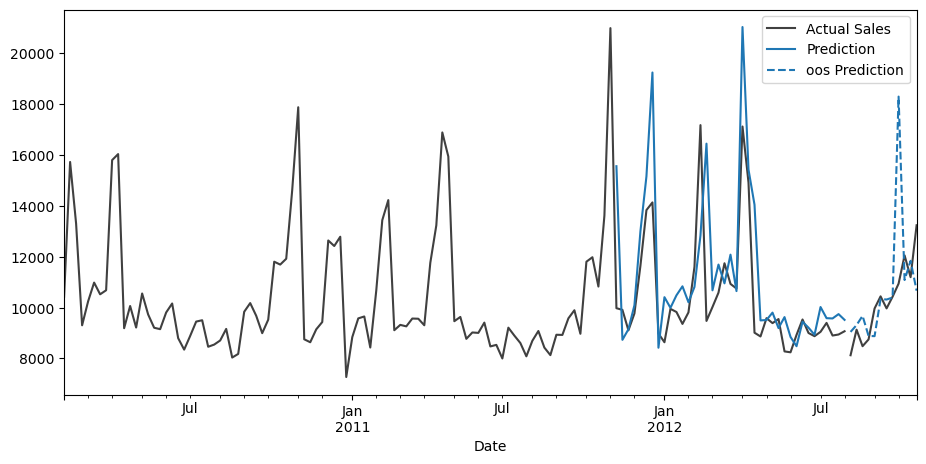

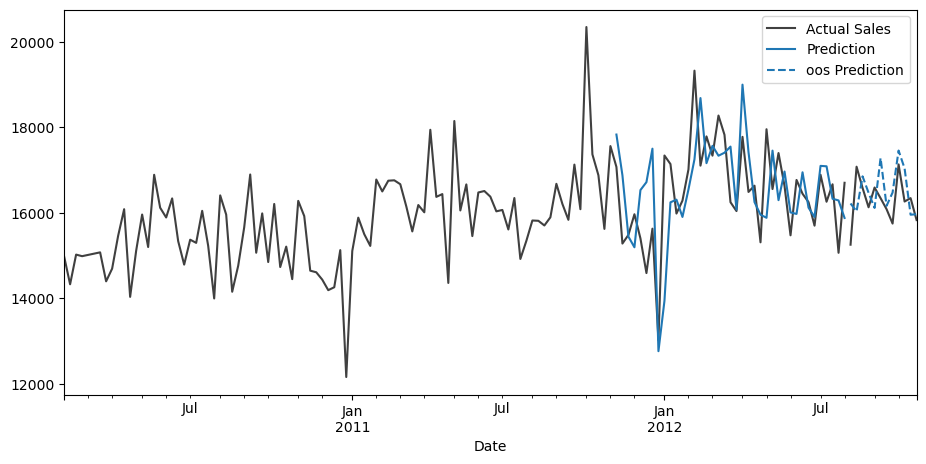

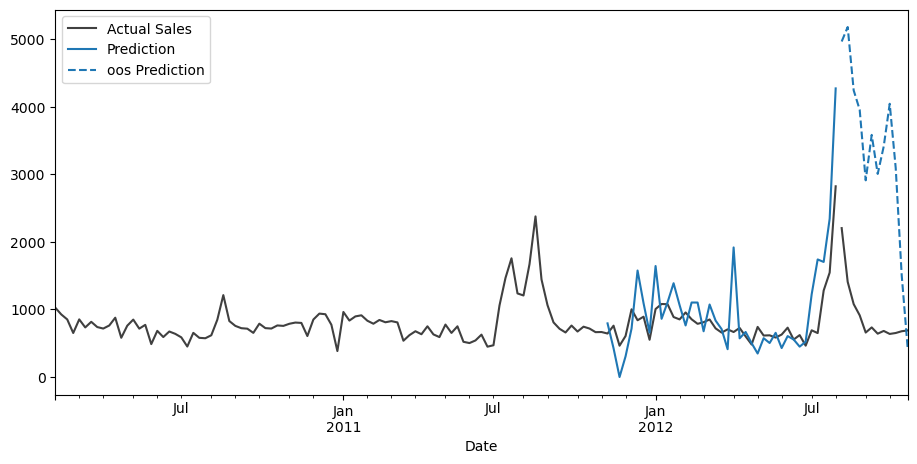

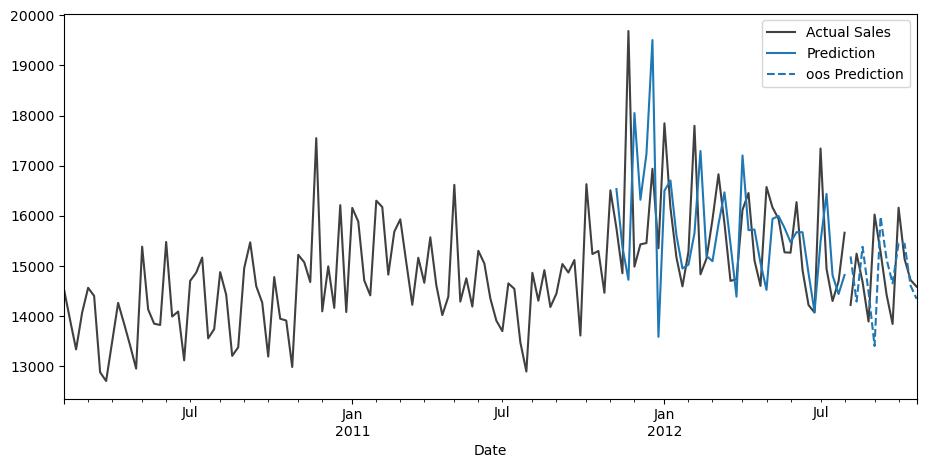

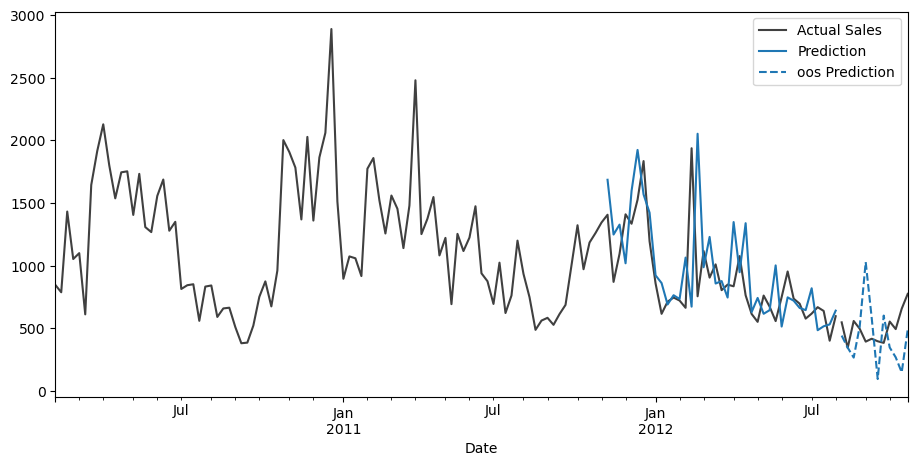

...

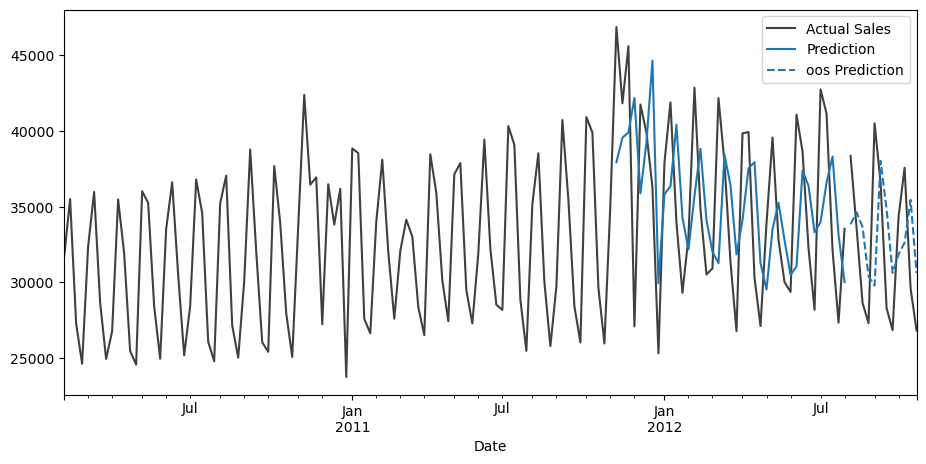

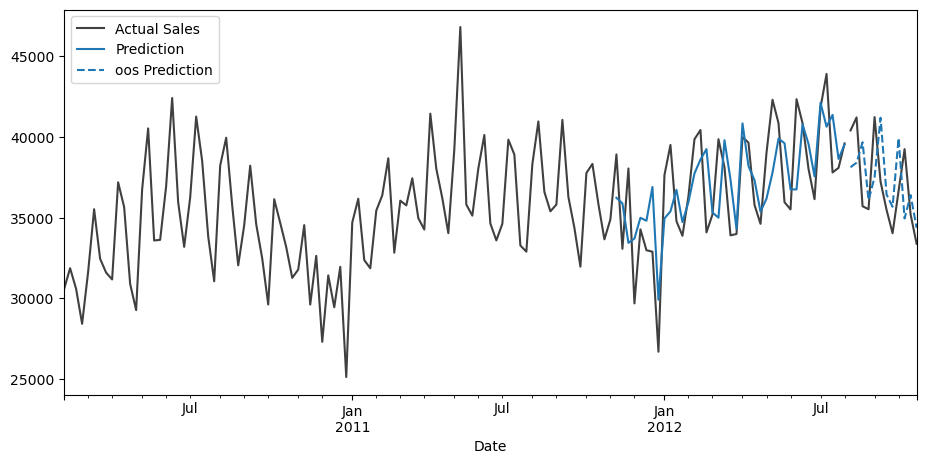

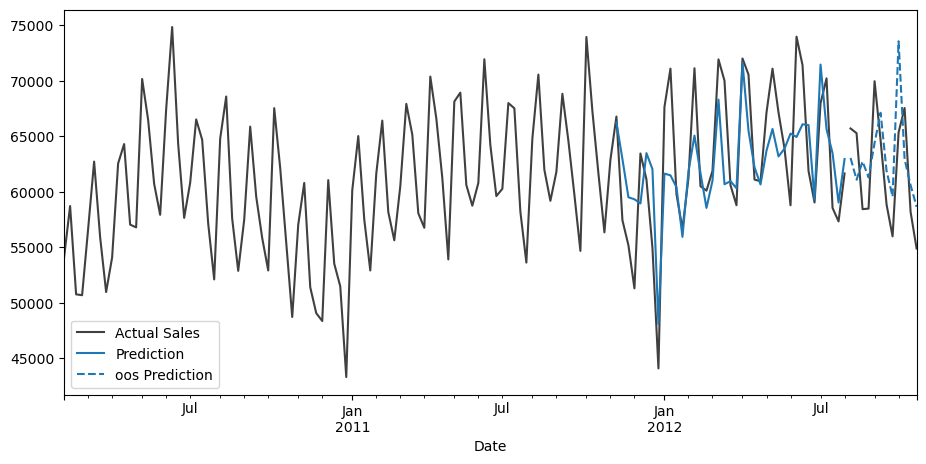

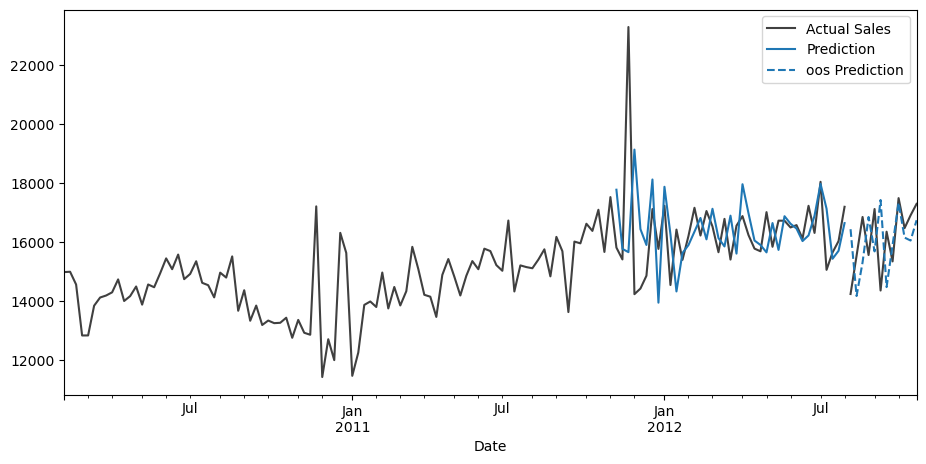

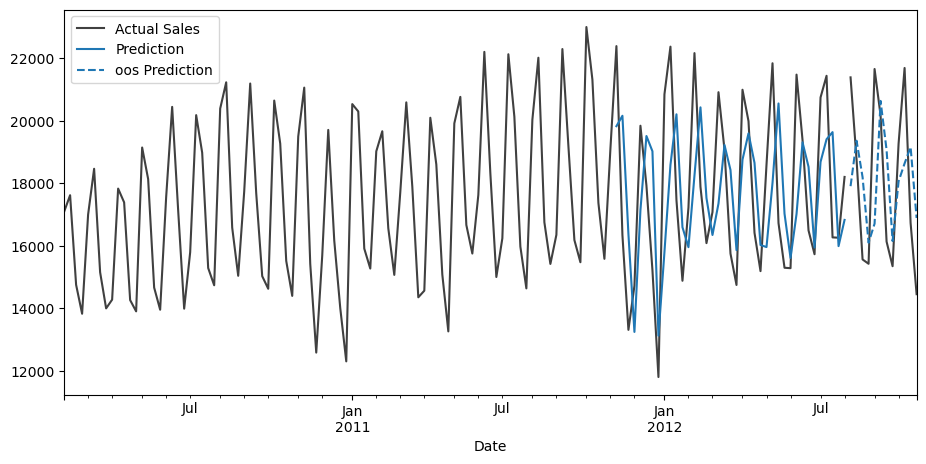

In [85]:
draw_plots(y_fit_xgb,y_pred_xgb,stores_data,42)

This model still doesn't perform as well in predicting small volumes and still exagerates the peaks. Let's evaluate another store

/opt/miniconda3/lib/python3.12/site-packages/pandas/plotting/_matplotlib/tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


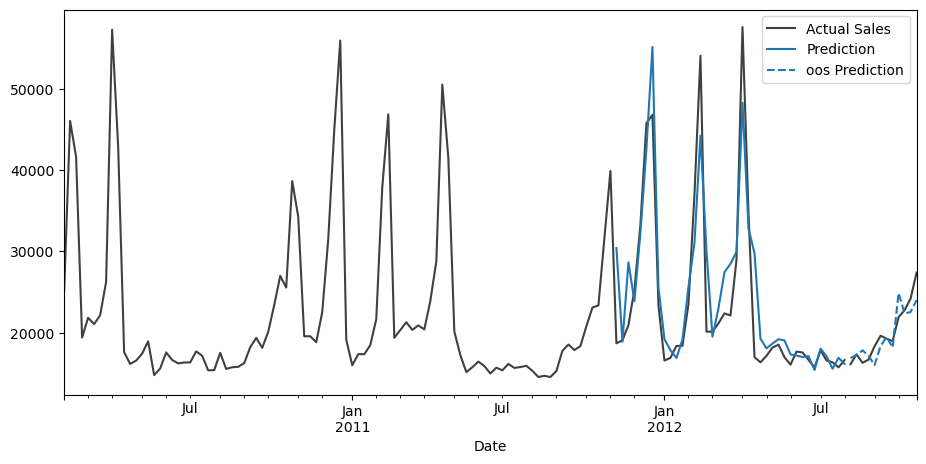

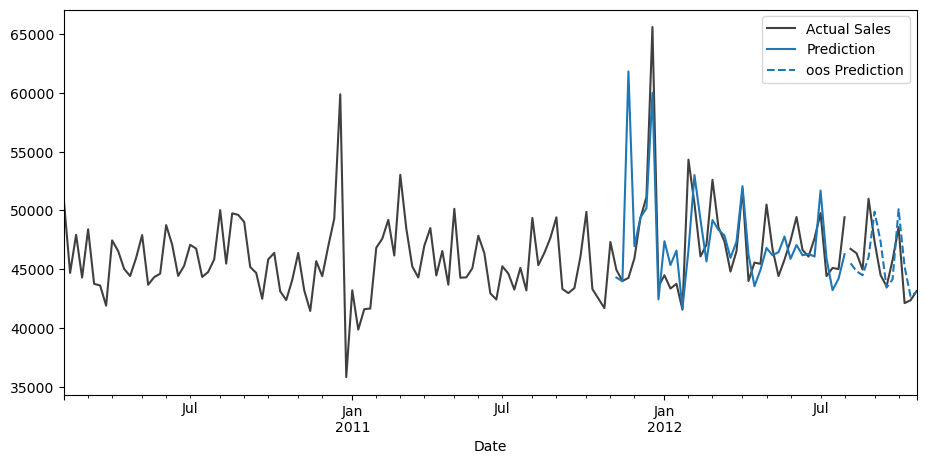

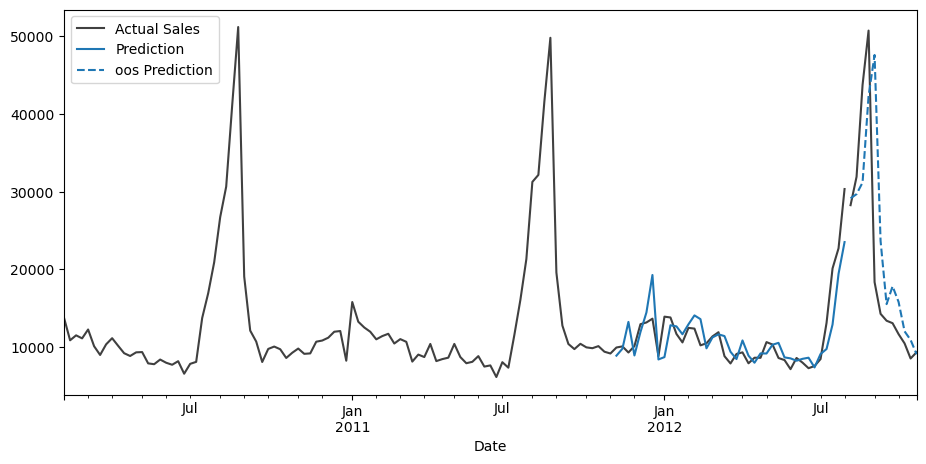

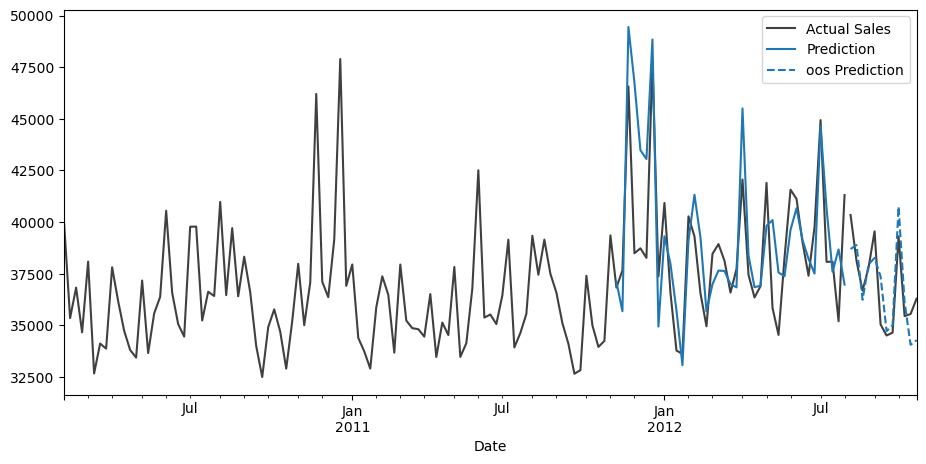

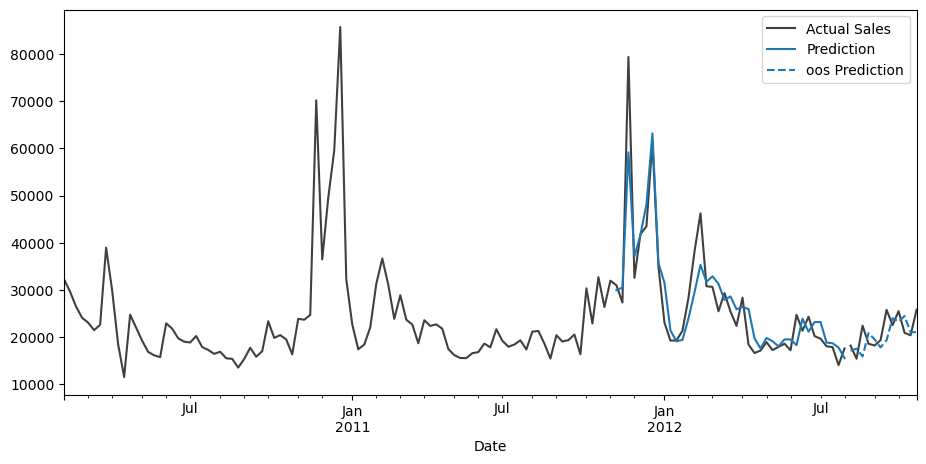

...

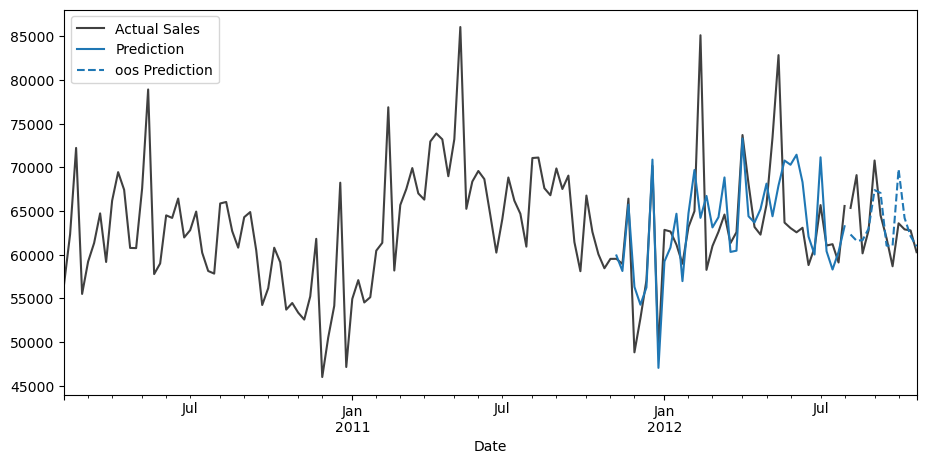

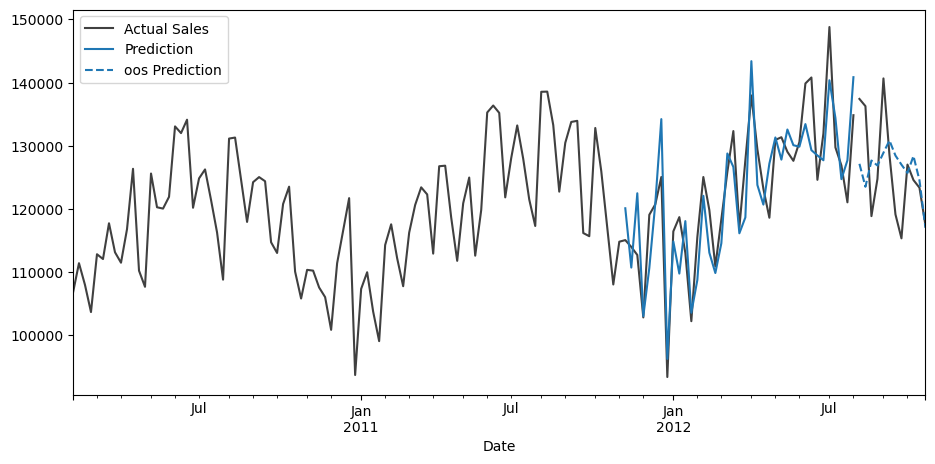

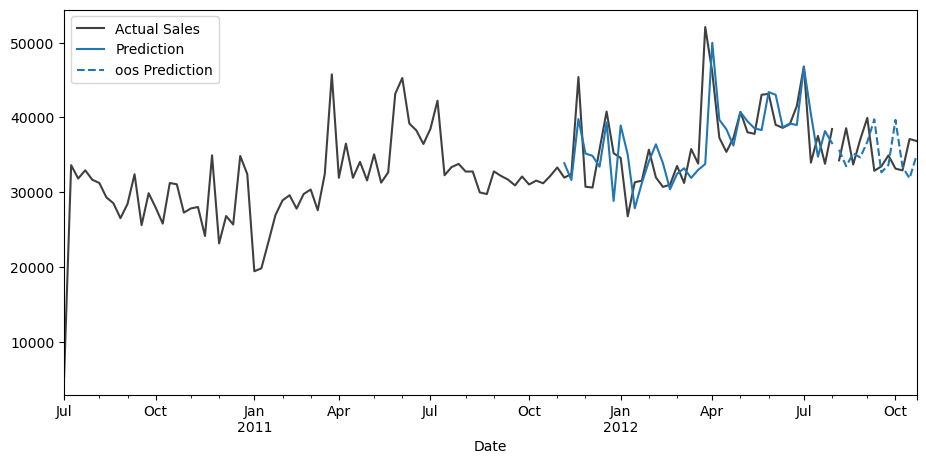

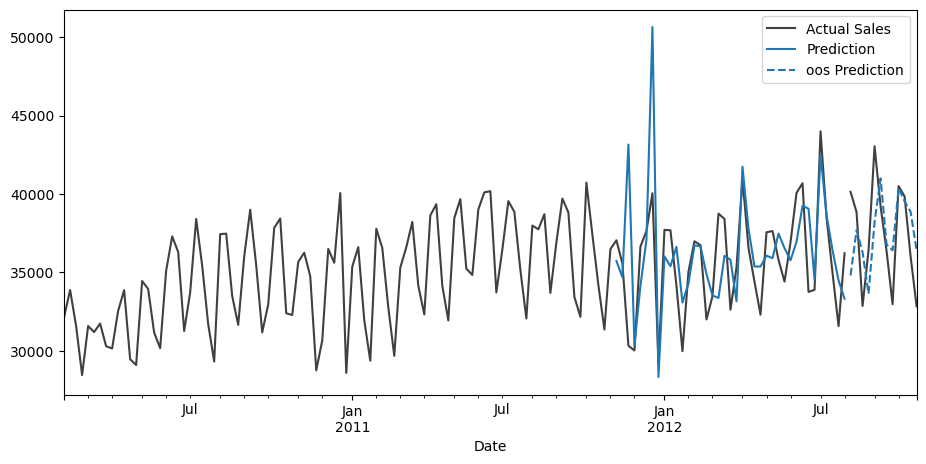

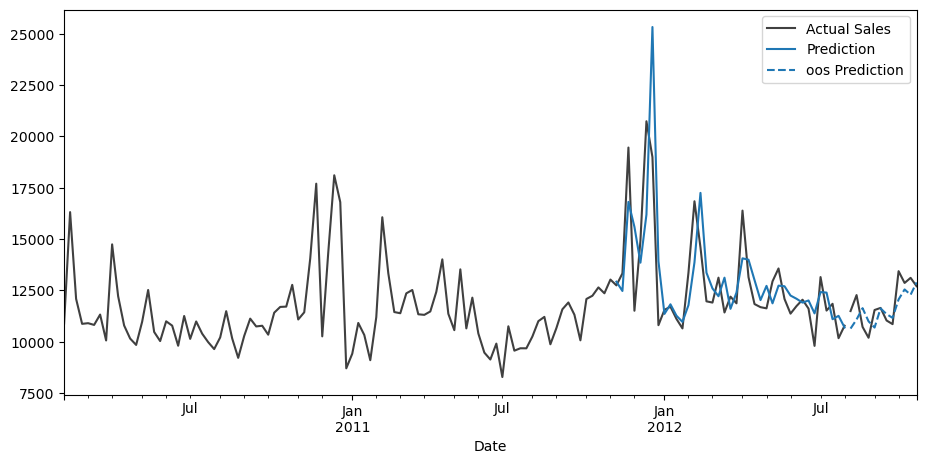

In [86]:

draw_plots(y_fit_xgb,y_pred_xgb,stores_data,1)

Not bad at all